https://github.com/Toblerity/Fiona/issues/944

In [75]:
import fiona

In [76]:
import matplotlib.pyplot as plt
from gerrychain import (GeographicPartition, Partition, Graph, MarkovChain,
                        proposals, updaters, constraints, accept, Election)
from gerrychain.proposals import recom
from functools import partial
import pandas

In [77]:
import maup
import numpy as np
import geopandas
import matplotlib.pyplot as plt
from gerrychain import (GeographicPartition, Partition, Graph, MarkovChain,
                        proposals, updaters, constraints, accept, Election)
from gerrychain.updaters import Tally, cut_edges, exterior_boundaries, exterior_boundaries_as_a_set
from networkx import is_connected, connected_components


In [78]:
graph = Graph.from_file("./IA_counties.zip", ignore_errors=True)
precincts = geopandas.read_file("./IA_counties.zip")

C:\Users\darre\anaconda3\envs\gerrychain\lib\site-packages\gerrychain\graph\graph.py:162: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  areas = df.geometry.area.to_dict()


In [79]:
components = list(connected_components(graph))
biggest_component_size = max(len(c) for c in components)
problem_components = [c for c in components if len(c) != biggest_component_size]
print(is_connected(graph))
for component in problem_components:
    for node in component:
        graph.remove_node(node)
print(is_connected(graph))

True
True


In [80]:
from gerrychain.constraints.contiguity import contiguous_components, contiguous
from gerrychain import Partition

In [81]:
election = Election("PRES16", {"Dem": "PRES16D", "Rep": "PRES16R"})

initial_partition = GeographicPartition(
    graph,
    assignment="CD",
    updaters={
        "cut_edges": cut_edges,
        "population": Tally("TOTPOP", alias="population"),
        "PRES16": election
    }
)

In [82]:
contiguous_components(initial_partition)

{'1': [<Graph [20 nodes, 31 edges]>],
 '4': [<Graph [39 nodes, 73 edges]>],
 '3': [<Graph [16 nodes, 26 edges]>],
 '2': [<Graph [24 nodes, 45 edges]>]}

In [83]:
for district, pop in initial_partition["population"].items():
    print("District {}: {}".format(district, pop))

District 1: 761548
District 4: 761571
District 3: 761612
District 2: 761624


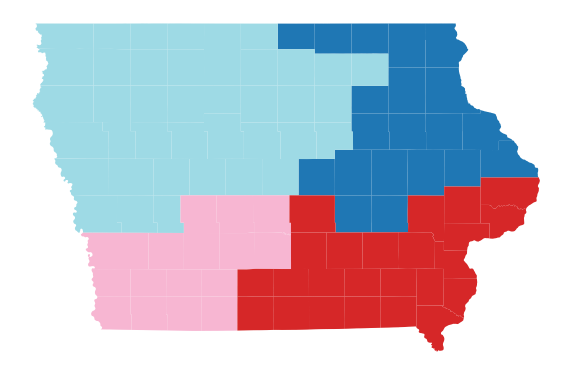

In [84]:
initial_partition.plot(figsize=(10, 10), cmap="tab20")
plt.axis('off')
plt.show()

In [85]:
sum_population = sum(initial_partition["population"].values())
ideal_population = sum_population / len(initial_partition)

# We use functools.partial to bind the extra parameters (pop_col, pop_target, epsilon, node_repeats)
# of the recom proposal.
proposal = partial(recom,
                   pop_col="TOTPOP",
                   pop_target=ideal_population,
                   epsilon=.9,
                   node_repeats=2
                  )

In [86]:
compactness_bound = constraints.UpperBound(
    lambda p: len(p["cut_edges"]),
    2*len(initial_partition["cut_edges"])
)

pop_constraint = constraints.within_percent_of_ideal_population(initial_partition, .02)

In [87]:
from gerrychain import MarkovChain
from gerrychain.constraints import single_flip_contiguous, contiguous
from gerrychain.proposals import propose_random_flip
from gerrychain.accept import always_accept
steps = 100
chain = MarkovChain(
    proposal=proposal,
    constraints=[single_flip_contiguous, compactness_bound],
    accept=always_accept,
    initial_state=initial_partition,
    total_steps=steps
)

In [88]:
last1 = None
for partition in chain.with_progress_bar():
    last1 = partition

100%|██████████| 100/100 [01:22<00:00,  1.22it/s]


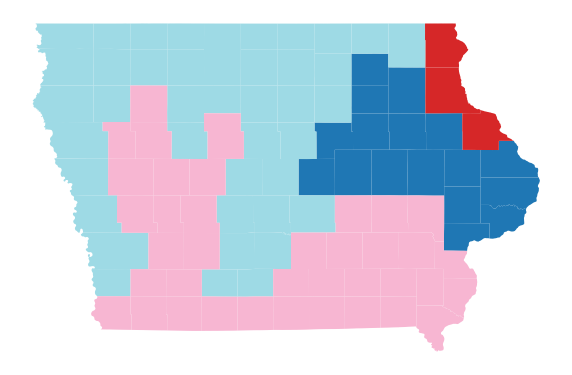

In [89]:
last1.plot(figsize=(10, 10), cmap="tab20")
plt.axis('off')
plt.show()

In [90]:
last1

<GeographicPartition [4 parts]>

In [91]:
initial_partition2 = GeographicPartition(
    graph,
    assignment="CD",
    updaters={
        "cut_edges": cut_edges,
        "population": Tally("TOTPOP", alias="population"),
        "PRES16": election
    }
)
initial_partition2.assignment = last1.assignment
initial_partition2.subgraphs = last1.subgraphs

In [92]:
proposal = partial(recom,
                   pop_col="TOTPOP",
                   pop_target=ideal_population,
                   epsilon=.7,
                   node_repeats=2
                  )

In [93]:
steps = 100
chain2 = MarkovChain(
    proposal=proposal,
    constraints=[single_flip_contiguous, compactness_bound],
    accept=always_accept,
    initial_state=initial_partition2,
    total_steps=steps
)

In [94]:
last2 = None
for partition in chain2.with_progress_bar():
    last2 = partition

100%|██████████| 100/100 [03:41<00:00,  2.22s/it]


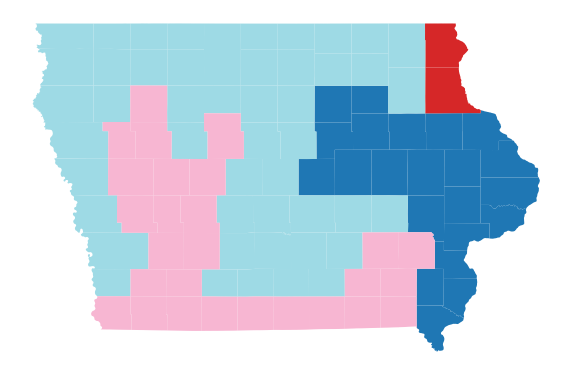

In [95]:
last2.plot(figsize=(10, 10), cmap="tab20")
plt.axis('off')
plt.show()

In [97]:
compactness_bound = constraints.UpperBound(
    lambda p: len(p["cut_edges"]),
    2*len(last2["cut_edges"])
)

In [105]:
initial_partition3 = GeographicPartition(
    graph,
    assignment="CD",
    updaters={
        "cut_edges": cut_edges,
        "population": Tally("TOTPOP", alias="population"),
        "PRES16": election
    }
)
initial_partition3.assignment = last2.assignment
initial_partition3.subgraphs = last2.subgraphs

proposal = partial(recom,
                   pop_col="TOTPOP",
                   pop_target=ideal_population,
                   epsilon=.3,
                   node_repeats=2
                  )
steps = 10
chain = MarkovChain(
    proposal=proposal,
    constraints=[single_flip_contiguous, compactness_bound],
    accept=always_accept,
    initial_state=initial_partition3,
    total_steps=steps
)
last3 = None
for partition in chain.with_progress_bar():
    last3 = partition

100%|██████████| 10/10 [00:45<00:00,  4.58s/it]


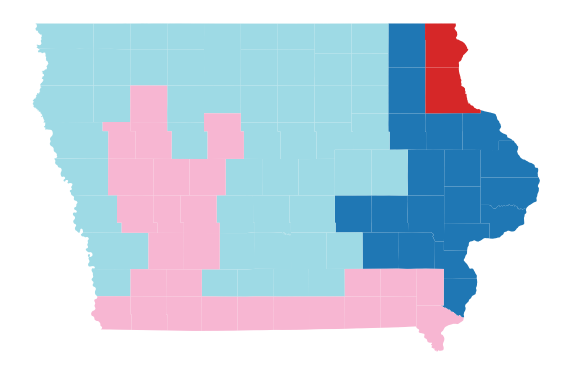

In [106]:
last3.plot(figsize=(10, 10), cmap="tab20")
plt.axis('off')
plt.show()

In [110]:
initial_partition4 = GeographicPartition(
    graph,
    assignment="CD",
    updaters={
        "cut_edges": cut_edges,
        "population": Tally("TOTPOP", alias="population"),
        "PRES16": election
    }
)
initial_partition4.assignment = last3.assignment
initial_partition4.subgraphs = last3.subgraphs

proposal = partial(recom,
                   pop_col="TOTPOP",
                   pop_target=ideal_population,
                   epsilon=.05,
                   node_repeats=2
                  )
steps = 5
chain = MarkovChain(
    proposal=proposal,
    constraints=[single_flip_contiguous, compactness_bound],
    accept=always_accept,
    initial_state=initial_partition4,
    total_steps=steps
)
last4 = None
for partition in chain.with_progress_bar():
    last4 = partition

100%|██████████| 5/5 [00:28<00:00,  5.79s/it]


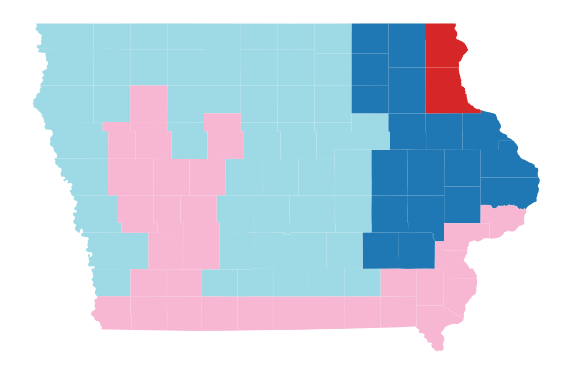

In [112]:
last4.plot(figsize=(10, 10), cmap="tab20")
plt.axis('off')
plt.show()

In [ ]:
def exploration_chain(steps, pop_epsilon, pop_step, ideal_pop):
    saved_districtings = []
    num_chains = 1//pop_step + 1
    end_partition = initial_partition
    for i in range(num_chains):
        compactness_bound = constraints.UpperBound(
            lambda p: len(p["cut_edges"]),
            2*len(end_partition["cut_edges"])
        )
        initial_partition3 = GeographicPartition(
            graph,
            assignment="CD",
            updaters={
                "cut_edges": cut_edges,
                "population": Tally("TOTPOP", alias="population"),
                "PRES16": election
            }
        )
        initial_partition.assignment = end_partition.assignment
        initial_partition.subgraphs = end_partition.subgraphs

        proposal = partial(recom,
                           pop_col="TOTPOP",
                           pop_target=ideal_population,
                           epsilon=pop_epsilon,
                           node_repeats=2
                          )
        chain = MarkovChain(
            proposal=proposal,
            constraints=[single_flip_contiguous, compactness_bound],
            accept=always_accept,
            initial_state=initial_partition,
            total_steps=steps[i])
        step = 0
        for partition in chain.with_progress_bar():
            end_partition = partition
            if (step % 25 == 0 or step == steps[i]):
                saved_districtings.append(end_partition)
            step += 1
        pop_epsilon -= pop_step
        if pop_epsilon <= 0:
            pop_epsilon = .02
        